In [1]:
import pandas as pd
import numpy as np

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
df_main = pd.read_csv("train.csv")
df_competetion = pd.read_csv('test.csv')

In [3]:
train = df_main.iloc[:,0].to_frame()

In [4]:
train['pixels'] = list(df_main.iloc[:,1:].values)

In [5]:
import matplotlib.pyplot as plt

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42000 entries, 0 to 41999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   label   42000 non-null  int64 
 1   pixels  42000 non-null  object
dtypes: int64(1), object(1)
memory usage: 656.4+ KB


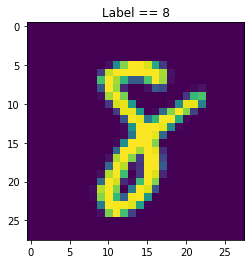

In [7]:
row = 300
plt.title(f"Label == {train.loc[row,'label']}")
plt.imshow(train.loc[row,'pixels'].reshape(28,28,1))

In [8]:
# Normalize the Data
from sklearn.preprocessing import StandardScaler
std_scaler = StandardScaler()

In [9]:
df_main_scaled = pd.DataFrame(std_scaler.fit_transform(df_main.iloc[:,1:].values), columns = [f"pixel_{i}" for i in range(df_main.shape[1] - 1)])
df_main_scaled['Label'] = df_main.iloc[:,0]

In [10]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 0.90)
pca.fit(df_main_scaled.drop(columns = ['Label']))
df_main_pca = pca.transform(df_main_scaled.drop(columns = ['Label']))

In [11]:
df_main_pca = pd.DataFrame(df_main_pca, columns = [f'PCA_COMP_{i}' for i in range(df_main_pca.shape[1])])
df_main_pca['Label'] = df_main_scaled['Label']

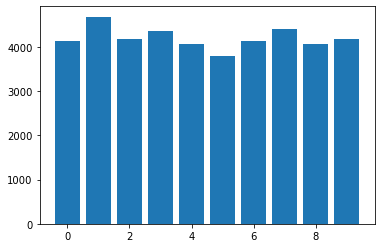

In [12]:
df_to_plot = df_main_pca.Label.value_counts(dropna=False).sort_index().rename('Label_Count').reset_index()
plt.bar(df_to_plot.index, df_to_plot.Label_Count)
plt.show()

In [13]:
from sklearn.model_selection import train_test_split

In [14]:
X = df_main_pca.loc[:,df_main_pca.columns != 'Label']
y = df_main_pca.loc[:,'Label']

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 30, shuffle = True)

In [16]:
from sklearn.svm import SVC

In [17]:
# kernel = rbf
svm_classifier = SVC(random_state = 30)

In [18]:
# kernel = poly
svm_classifier_2 = SVC(kernel = 'poly', degree = 5, C = 1, random_state = 30)

In [19]:
svm_classifier.fit(X_train,y_train)

SVC(random_state=30)

In [20]:
svm_classifier_2.fit(X_train,y_train)

SVC(C=1, degree=5, kernel='poly', random_state=30)

In [21]:
y_pred_test = svm_classifier.predict(X_test)

In [22]:
y_pred_train = svm_classifier.predict(X_train)

In [23]:
y_pred_test_2 = svm_classifier_2.predict(X_test)

In [24]:
y_pred_train_2 = svm_classifier_2.predict(X_train)

In [25]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

In [26]:
# svm_classifier
res_dict = {"f1_score" : f1_score(y_test, y_pred_test, average = 'weighted'),
            "accuracy_score" : accuracy_score(y_test, y_pred_test)}
for metric, score in res_dict.items():
    print(f"for test :: {metric!r:^20} = {score: >10.2%}")

for test ::      'f1_score'      =     96.50%
for test ::   'accuracy_score'   =     96.50%


In [27]:
# svm_classifier
res_dict = {"f1_score" : f1_score(y_train, y_pred_train, average = 'weighted'),
            "accuracy_score" : accuracy_score(y_train, y_pred_train)}
for metric, score in res_dict.items():
    print(f"for train :: {metric!r:^20} = {score: >10.2%}")

for train ::      'f1_score'      =     98.30%
for train ::   'accuracy_score'   =     98.30%


In [28]:
# svm_classifier_2
res_dict = {"f1_score" : f1_score(y_test, y_pred_test_2, average = 'weighted'),
            "accuracy_score" : accuracy_score(y_test, y_pred_test_2)}
for metric, score in res_dict.items():
    print(f"for test :: {metric!r:^20} = {score: >10.2%}")

for test ::      'f1_score'      =     76.19%
for test ::   'accuracy_score'   =     72.10%


In [29]:
# svm_classifier_2
res_dict = {"f1_score" : f1_score(y_train, y_pred_train_2, average = 'weighted'),
            "accuracy_score" : accuracy_score(y_train, y_pred_train_2)}
for metric, score in res_dict.items():
    print(f"for train :: {metric!r:^20} = {score:>10.2%}")

for train ::      'f1_score'      =     79.21%
for train ::   'accuracy_score'   =     75.44%


In [31]:
import types
def imports():
    for name, val in globals().items():  # Everytime Globals is called, dict size will change as every run adds a new cell run info like _i120 and _120
        if isinstance(val, types.ModuleType):
            yield val.__name__, name

for module, alias in imports(): print(f"{module:<50} as {' '*5}{alias}")

builtins                                           as      __builtin__
builtins                                           as      __builtins__
pandas                                             as      pd
numpy                                              as      np
matplotlib.pyplot                                  as      plt
types                                              as      types


In [32]:
from sklearn.manifold import TSNE
import plotly.express as px

tsne = TSNE(n_components=2, random_state=0)
projections = tsne.fit_transform(df_main_pca.loc[:,df_main_pca.columns != 'Label'])

fig = px.scatter(
    projections, x=0, y=1,
    color = df_main_pca['Label'], labels={'color': 'Label'}
)
fig.show()

/Users/aadil/opt/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/aadil/opt/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [33]:
tsne_3d = TSNE(n_components=3, random_state=0)
projections = tsne_3d.fit_transform(df_main_pca.loc[:,df_main_pca.columns != 'Label'])

fig = px.scatter_3d(
    projections, x=0, y=1, z=2,
    color = df_main_pca['Label'], labels={'color': 'Label'}
)
fig.update_traces(marker_size=8)
fig.show()

/Users/aadil/opt/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/Users/aadil/opt/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

